### Problems :
    - Predict Red Wire Quality
    - dataset : https://www.kaggle.com/uciml/red-wine-quality-cortez-et-al-2009?select=winequality-red.csv

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
from pandas_profiling import ProfileReport
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV
from ipynb.fs.full.data_cleaning_function import data_cleaning,imbalance_data_check,numeric_histogram_plot_for_classification_model
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense

 

os.environ['TF_CPP_MIN_LOG_LEVEL']='2'


# 1. Data Collection

In [2]:
df=pd.read_csv('diabetes.csv')

In [3]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


# 2. Exploratory Data Analysis (EDA)
### 2.1-Overall Profile Report Sumamry :
 - From Profile report and data cleaning function :
      - we can see that the missing data is filled with "0"

In [4]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
df=data_cleaning(df,0)


Data Cleaning Report - Basic Data Informations

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB
None

Data Cleaning Report - Summary of total "NAN" rows

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin      

### 2.2-Imbalance Data Check


 Imbalance Data Check - Frequency Table of Label Data :
    Outcome  Count
0        0    500
1        1    268 

Imbalance Data Check - Label Data Distribution % :
           0          1
0  65.104167  34.895833

Imbalance Data Check - Data Distribution % Summary Plot :



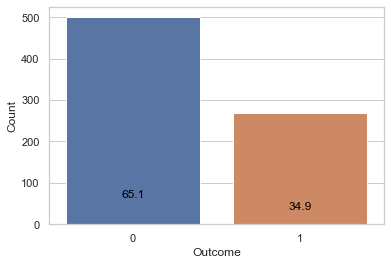

In [6]:
imbalance_data_check(df,'Outcome')

### 2.3-Data Distribution Check

<Figure size 432x288 with 0 Axes>

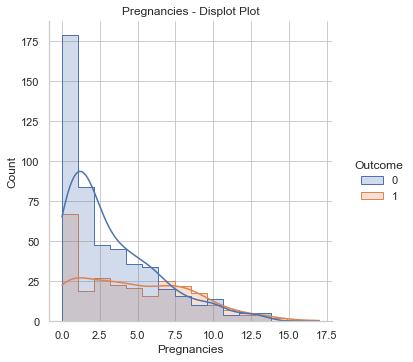

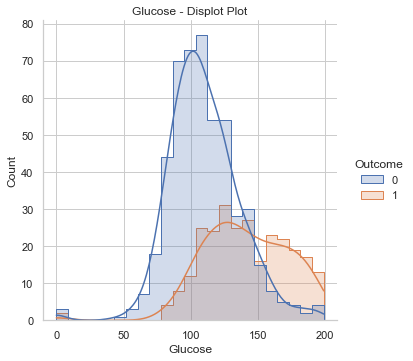

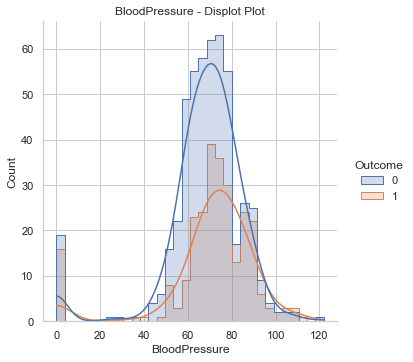

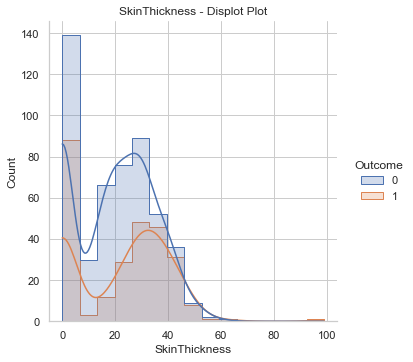

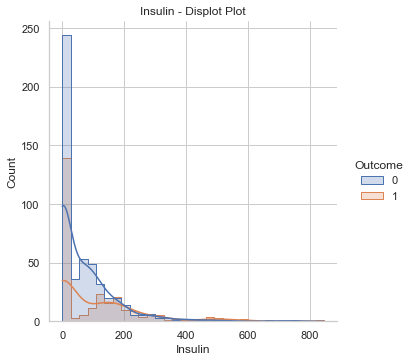

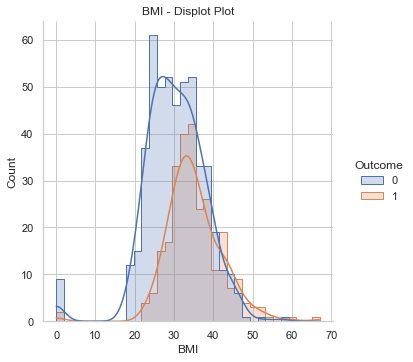

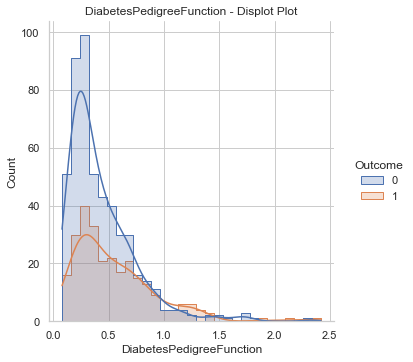

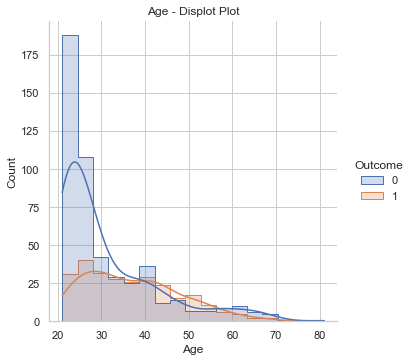

In [7]:
numeric_histogram_plot_for_classification_model(df,'Outcome',False)

C:\Users\User\.conda\envs\tf2.4\lib\site-packages\seaborn\axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


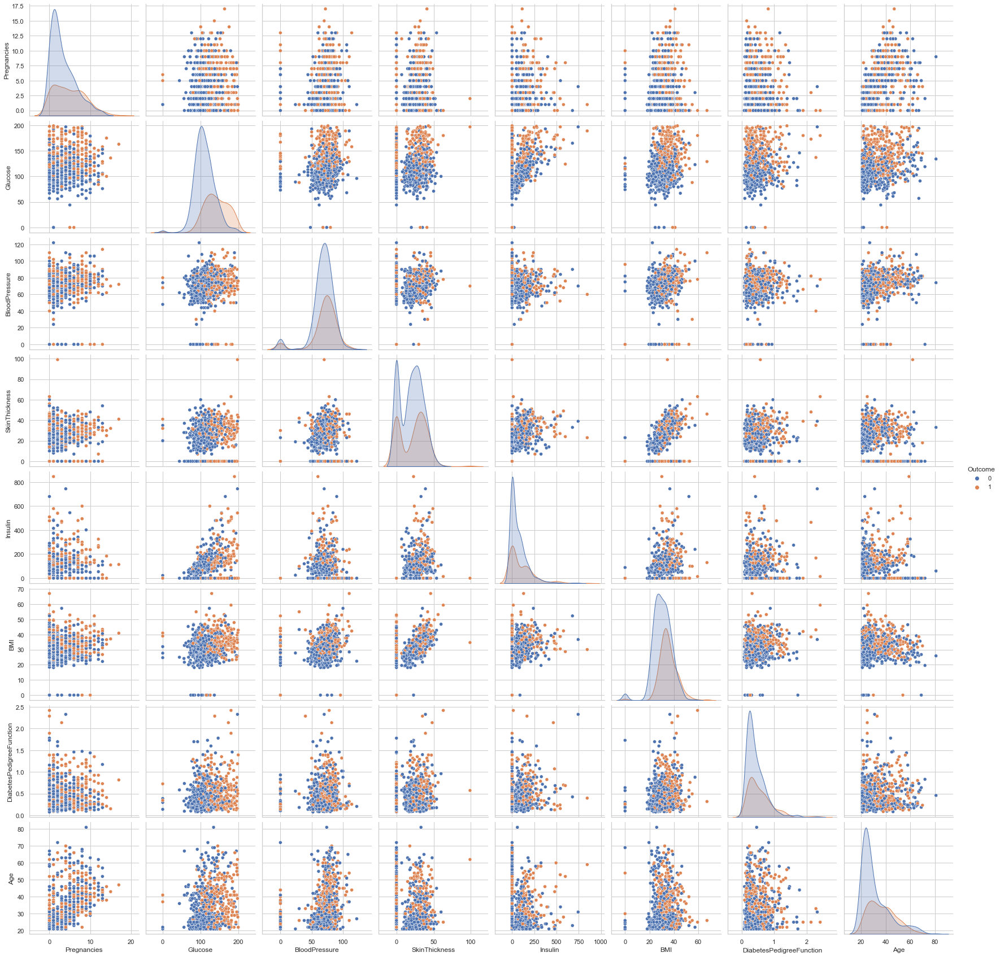

In [8]:
sns.pairplot(df,hue='Outcome',size=3)

### 2.4-Correlation Analysis

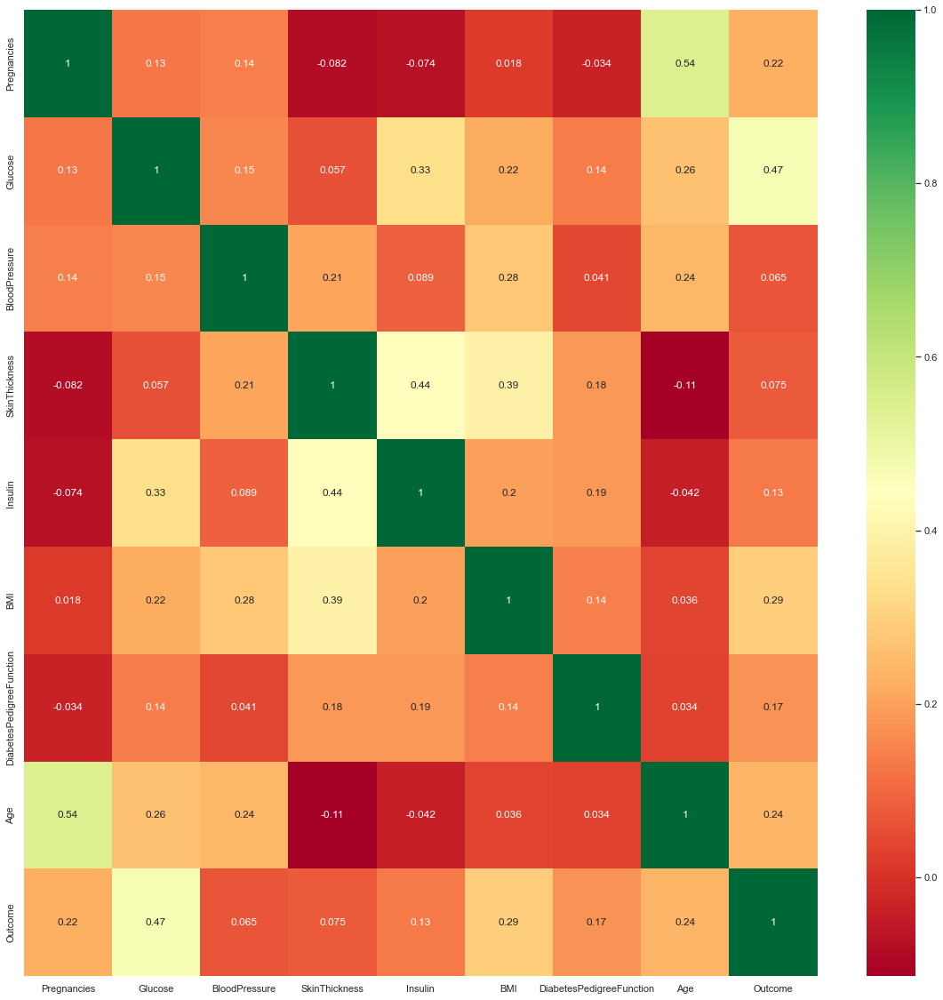

In [9]:
import matplotlib.pyplot as plt
corrmatrix=df.corr()
corr_features=corrmatrix.index

plt.figure(figsize=(20,20))

g=sns.heatmap(df[corr_features].corr(),annot=True,cmap='RdYlGn')

## 3. Data Cleaning

### Outlier Detection

## 4. Data Preparation For model Training

In [10]:
X=df.drop('Outcome',axis=1)
Y=df['Outcome']

In [11]:
X_train,x_test,Y_train,y_test=train_test_split(X,Y,test_size=0.2,stratify=Y)

In [12]:
print(sum(Y_train)/len(Y_train))
print(sum(y_test)/len(y_test))

0.3485342019543974
0.35064935064935066


In [13]:
## Sequential().add(layers.Dense()) 
# Dense layer = Fully connected neural network

In [14]:
ann_model=Sequential([
    Dense(12,input_dim=8,activation='relu'),
    Dense(8,activation='relu'), # actiavtion i use 'relu' to prevent exploding gradient problem
    Dense(1,activation='sigmoid') # output layer since its binary classification output i use "signoid"
                    ])

# OR 

# ann_model=Sequential()
# ann_model.add(Dense(12,input_dim=8,activation='relu')),
# ann_model.add(Dense(8,activation='relu'))# actiavtion i use 'relu' to prevent exploding gradient problem
# ann_model.add(Dense(1,activation='sigmoid')) # output layer since its binary classification output i use "signoid"
                    

In [15]:
## Compile model
ann_model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])

In [ ]:
## fitting model
ann_model.fit(X_train,Y_train,epochs=150,batch_size=10)

In [ ]:
# train model evaluation
loss,accuracy=ann_model.evaluate(X_train,Y_train)

print(f'loss: {loss}, accuracy: {accuracy}')

In [ ]:
from sklearn.metrics import accuracy_score
y_pred=ann_model.predict(x_test)
y_pred=np.round(y_pred)
y_pred

In [ ]:
from sklearn.metrics import classification_report,accuracy_score
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))

## 5. Model Tuning 

### 5.1 - Internal Layer Model Tuning 
 - Reference : https://github.com/krishnaik06/Hidden-Layers-Neurons/blob/master/How%20to%20Select%20how%20many%20hidden%20layer%20and%20neurons%20in%20a%20neural%20network.ipynb
 
 
 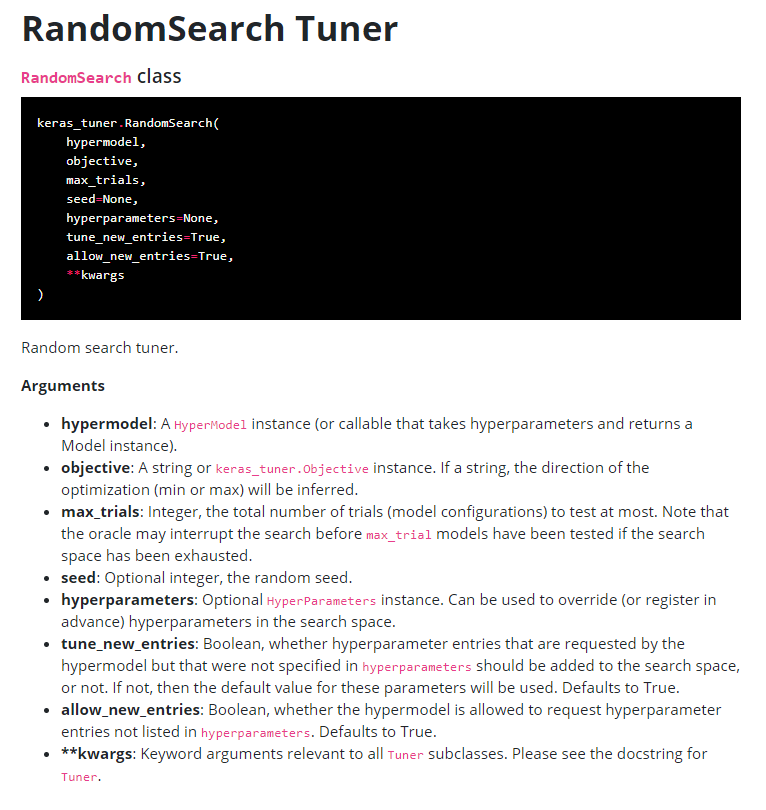

In [ ]:
## Create a layering model function
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import GridSearchCV
from keras.layers import Activation,Dropout
from keras_tuner.tuners import RandomSearch
from tensorflow import keras





# Step 1- [Keras Tuner] - Tuned layers and node
# only can auto tuned how many layers and nodes with given activation and dropout value
# https://keras.io/api/keras_tuner/tuners/random/
def build_model(hp):
    model=Sequential()

    for i in range(hp.Int('number_layers',1,20)):

        if i ==1:
            model.add(Dense(units=hp.Int('units_'+str(i),
                                         min_value=32,
                                         max_value=512,
                                         step=32),
                            input_dim=X_train.shape[1],)) # column number of X_train ( input node)
            model.add(Activation('relu'))
#             model.add(Dropout(0.5)) # dropout value must be in range of 0.001-0.999
        else:
            model.add(Dense(units=hp.Int('units_'+str(i),
                                         min_value=32,
                                         max_value=512,
                                         step=32)))
            model.add(Activation('relu'))
#             model.add(Dropout(0.5))

    model.add(Dense(units=1,
                    kernel_initializer='glorot_uniform',
                    activation='sigmoid'
                    ))
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=hp.Choice('learning_rate',values=[1e-2,1e-3,1e-4])),
                  loss='binary_crossentropy',metrics=['accuracy'])

    return model


# Step 2 - Tuned Other Hyper Parameter
def create_model(node,activation,drop_out_value,optimizer,loss_fuction,):
    model=Sequential()
    
    for i ,node in enumerate(node):
        
        if i ==0:
            model.add(Dense(units=node, # number of activation nodes
                            name="number_layers"+str(i), # name of layers
                            input_dim=X_train.shape[1], # column number of X_train ( input node)
                           ))
            model.add(Activation(activation))
            model.add(Dropout(drop_out_value))
        else:
            model.add(Dense(units=node, # number of activation nodes
                            name="number_layers"+str(i), # name of layers
                           ))
            model.add(Activation(activation))
            model.add(Dropout(drop_out_value))
            
    model.add(Dense(units=1,
                    kernel_initializer='glorot_uniform',
                    activation='sigmoid'
                   ))
    model.compile(optimize=optimizer,loss=loss_fuction,metrics=['accuracy'])
    
    return model

# node
# activation
# drop_out_value
# optimizer
# loss_fuction



### Tuning Run 1

#### Step 1- Layer and nodes Tuning

In [ ]:
# Step 1
random_search_1=RandomSearch(build_model,
                             objective='val_accuracy',
                             max_trials=5,
                             executions_per_trial=3,
                             seed=42,
                             directory='diabetes_prediction',
                             project_name='diabetes_prediction_tuner_0'
                            )


In [ ]:
random_search_1.search(X_train,Y_train,epochs=200,validation_data=(x_test,y_test))

In [ ]:
random_search_1.results_summary()

#### Step 2- HyperParameter Tuning

In [ ]:
# Step 2
ann_model=KerasClassifier(build_fn=create_model)
ann_model


In [ ]:
# Step 2 
param_grid={'node': [(488,288,64,256,160,512,320,480,64,3480,64,320,128)],
            'activation': ['sigmoid','relu'],
            'batch_size': [10,50,100,200],
            'epochs': [50,150,200,400,500,700],
            'drop_out_value':[1.0,0.5,0.8],
            'optimizer':['adam'],
            'loss_fuction':['binary_crossentropy']
           }
param_grid



In [ ]:
optimal_params_gridsearchcv_1=GridSearchCV(estimator=ann_model,
                                           param_grid=param_grid,
                                           cv=5,
                                           verbose=3,
                                           n_jobs=-1
                                          )

In [ ]:
optimal_params_gridsearchcv_1.fit(X_train,Y_train)

In [ ]:
# pd.DataFrame(optimal_params_gridsearchcv_1.cv_results_).sort_values(by='rank_test_score',ascending=True)

### Tuning Run 2

### 5.2 - Model Hyper-parameter Tuning